In [ ]:
!pip install --no-index /kaggle/input/imc2024-packages-lightglue-rerun-kornia/* --no-deps
!mkdir -p /root/.cache/torch/hub/checkpoints
!cp /kaggle/input/aliked/pytorch/aliked-n16/1/* /root/.cache/torch/hub/checkpoints/
!cp /kaggle/input/lightglue/pytorch/aliked/1/* /root/.cache/torch/hub/checkpoints/
!cp /kaggle/input/lightglue/pytorch/aliked/1/aliked_lightglue.pth /root/.cache/torch/hub/checkpoints/aliked_lightglue_v0-1_arxiv-pth

In [ ]:
# General utilities
import matplotlib.pyplot as plt

import os
import sys
from tqdm import tqdm
from pathlib import Path
import gc
import numpy as np
from collections import defaultdict
import pandas as pd

import cv2
import torch
from torch import Tensor as T
import torch.nn.functional as F
import kornia as K
import kornia.feature as KF
from kornia_moons.viz import *
from PIL import Image
from transformers import AutoImageProcessor, AutoModel

import torch
from lightglue import match_pair
from lightglue import LightGlue, ALIKED, SuperPoint, SIFT, DISK
from lightglue.utils import load_image, rbd



def load_torch_image(file_name: Path | str, device=torch.device("cpu")):
    """Loads an image and adds batch dimension"""
    img = K.io.load_image(file_name, K.io.ImageLoadType.RGB32, device=device)[None, ...]
    return img

device = K.utils.get_cuda_device_if_available(0)

In [3]:
def embed_images(
    paths: list[Path],
    model_name: str,
    device: torch.device = torch.device("cpu"),
) -> T:
    """Computes image embeddings.
    
    Returns a tensor of shape [len(filenames), output_dim]
    """
    processor = AutoImageProcessor.from_pretrained(model_name)
    model = AutoModel.from_pretrained(model_name).eval().to(device)
    
    embeddings = []
    
    for i, path in tqdm(enumerate(paths), desc="Global descriptors"):
        image = load_torch_image(path)
        
        with torch.inference_mode():
            inputs = processor(images=image, return_tensors="pt", do_rescale=False).to(device)
            outputs = model(**inputs) # last_hidden_state and pooled
            
            # Max pooling over all the hidden states but the first (starting token)
            # To obtain a tensor of shape [1, output_dim]
            # We normalize so that distances are computed in a better fashion later
            embedding = F.normalize(outputs.last_hidden_state[:,1:].max(dim=1)[0], dim=-1, p=2)
            
        embeddings.append(embedding.detach().cpu())
    return torch.cat(embeddings, dim=0)

In [4]:
images_list = list(Path('/kaggle/input/image-matching-challenge-2024/test/church/images/').glob('*.png'))[4:8]
images_list

[PosixPath('/kaggle/input/image-matching-challenge-2024/test/church/images/00060.png'),
 PosixPath('/kaggle/input/image-matching-challenge-2024/test/church/images/00059.png'),
 PosixPath('/kaggle/input/image-matching-challenge-2024/test/church/images/00006.png'),
 PosixPath('/kaggle/input/image-matching-challenge-2024/test/church/images/00087.png')]

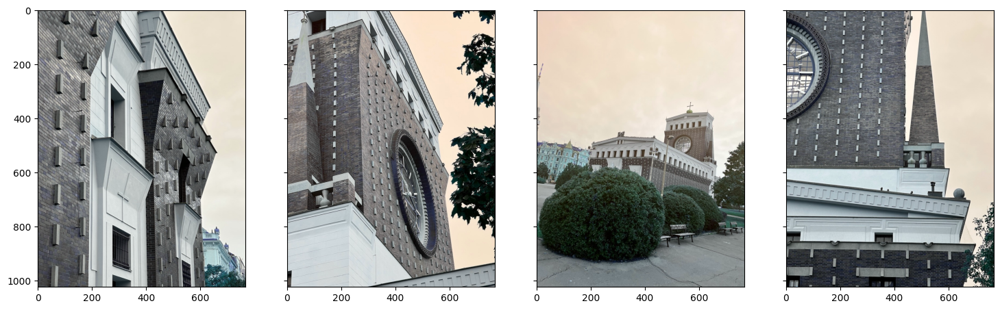

In [5]:
fig, ax = plt.subplots(nrows=1, ncols=4,figsize=(18, 12), sharey=True, sharex=True)
for i, fig_x in enumerate(ax.flatten()):
    image = cv2.imread(str(images_list[i]))
    fig_x.imshow(image)

In [6]:
embeddings = embed_images(images_list, "/kaggle/input/dinov2/pytorch/base/1")
distances = torch.cdist(embeddings, embeddings, p=2)
distances

/opt/conda/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
Global descriptors: 4it [00:01,  2.69it/s]


tensor([[0.0000, 0.2975, 0.3033, 0.2845],
        [0.2975, 0.0000, 0.2997, 0.2447],
        [0.3033, 0.2997, 0.0000, 0.2960],
        [0.2845, 0.2447, 0.2960, 0.0000]])

In [7]:
similarity_threshold: float = 0.6
tolerance = 1000
min_matches = 20
exhaustive_if_less = 20
p = 2.0

mask = distances <= similarity_threshold
image_indices = np.arange(len(images_list)) #список индексов

matches = []
    
for current_image_index in range(len(images_list)):
    mask_row = mask[current_image_index] 
    indices_to_match = image_indices[mask_row] #список индексов, где значение маски True
        
    if len(indices_to_match) < min_matches:
        indices_to_match = np.argsort(distances[current_image_index])[:min_matches] #сортировка индексов по возрастанию значения дистанции
        
            
    for other_image_index in indices_to_match:
        if other_image_index == current_image_index: #пропускаем если индекс картинки указывает саму на себя
               continue
            
            # Нам нужно проверить, находимся ли мы ниже определенного допуска по расстоянию поскольку для изображений, у которых недостаточно совпадений, мы выбрали
            # самые похожие на изображение, которое мы анализируем  
        if distances[current_image_index, other_image_index] < tolerance: #добавим пары индексов
            result = list(sorted([current_image_index, other_image_index.item()]))
            result = [*result, round(float(distances[current_image_index, other_image_index].cpu().numpy()), 4)]
            matches.append(tuple(result))

matches = sorted(list(set(matches))) 
matches

[(0, 1, 0.2975),
 (0, 2, 0.3033),
 (0, 3, 0.2845),
 (1, 2, 0.2997),
 (1, 3, 0.2447),
 (2, 3, 0.296)]

Downloading: "https://github.com/cvg/LightGlue/releases/download/v0.1_arxiv/superpoint_v1.pth" to /root/.cache/torch/hub/checkpoints/superpoint_v1.pth
100%|██████████| 4.96M/4.96M [00:00<00:00, 58.8MB/s]
Downloading: "https://raw.githubusercontent.com/cvlab-epfl/disk/master/depth-save.pth" to /root/.cache/torch/hub/checkpoints/depth-save.pth
100%|██████████| 4.17M/4.17M [00:00<00:00, 137MB/s]


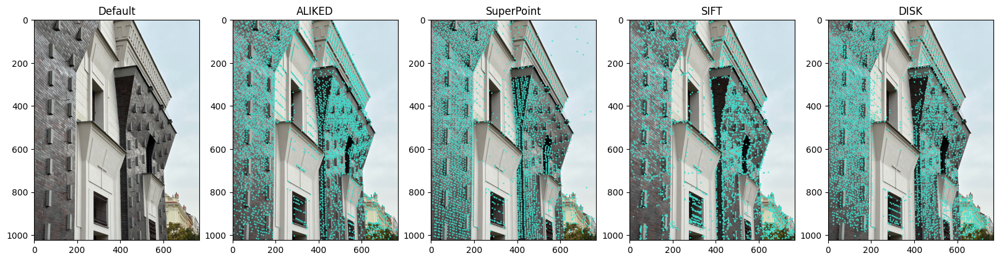

In [8]:
def show_result_extractors(image, features):
    fig, ax = plt.subplots(1, 5, figsize=(20, 50))
    ax[0].set_title('Default')
    ax[0].imshow(image[0, ...].permute(1,2,0).cpu())
    ax[1].set_title('ALIKED')
    ax[1].imshow(image[0, ...].permute(1,2,0).cpu())
    ax[1].scatter(features[0]['keypoints'][0, :, 0].cpu(), features[0]['keypoints'][0, :, 1].cpu(), s=0.5, c='turquoise')
    ax[2].set_title('SuperPoint')
    ax[2].imshow(image[0, ...].permute(1,2,0).cpu())
    ax[2].scatter(features[1]['keypoints'][0, :, 0].cpu(), features[1]['keypoints'][0, :, 1].cpu(), s=0.5, c='turquoise')
    ax[3].set_title('SIFT')
    ax[3].imshow(image[0, ...].permute(1,2,0).cpu())
    ax[3].scatter(features[2]['keypoints'][0, :, 0].cpu(), features[2]['keypoints'][0, :, 1].cpu(), s=0.5, c='turquoise')
    ax[4].set_title('DISK')
    ax[4].imshow(image[0, ...].permute(1,2,0).cpu())
    ax[4].scatter(features[3]['keypoints'][0, :, 0].cpu(), features[3]['keypoints'][0, :, 1].cpu(), s=0.5, c='turquoise')

    plt.show()


dtype = torch.float32 
extractors = [
    ALIKED(max_num_keypoints=4096, detection_threshold=0.01, resize=1024).eval().to(device, dtype),
    SuperPoint(max_num_keypoints=4096, detection_threshold=0.01, resize=1024).eval().to(device, dtype),
    SIFT(max_num_keypoints=4096, detection_threshold=0.01, resize=1024).eval().to(device, dtype),
    DISK(max_num_keypoints=4096, detection_threshold=0.01, resize=1024).eval().to(device, dtype),
]

features = []
for extractor in extractors:
    path = images_list[0]
    image = load_torch_image(path, device=device).to(dtype)
    features.append(extractor.extract(image))

show_result_extractors(image, features)
del extractor, features

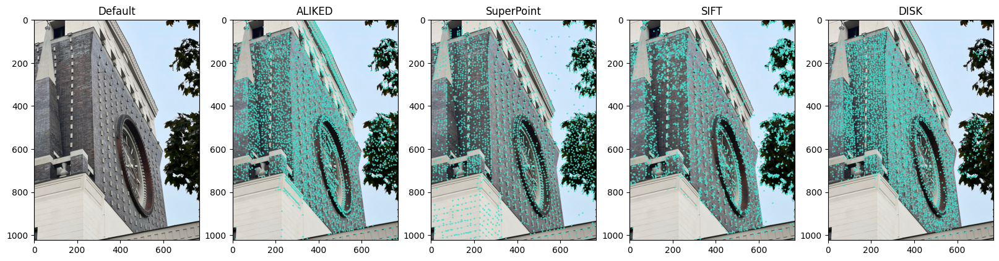

In [9]:
features = []
for extractor in extractors:
    path = images_list[-3]
    image = load_torch_image(path, device=device).to(dtype)
    features.append(extractor.extract(image))


show_result_extractors(image, features)
del extractor, features

In [10]:
def get_matching_keypoints(kp1, kp2, idxs):
    mkpts1 = kp1[idxs[:, 0]]
    mkpts2 = kp2[idxs[:, 1]]
    return mkpts1, mkpts2

def get_img(image0, image1, feats0, feats1, inliers, ax, distance):
    ax.set_title(f'distance: {distance}')
    draw_LAF_matches(
        KF.laf_from_center_scale_ori(feats0['keypoints'][0][None].cpu()),
        KF.laf_from_center_scale_ori(feats1['keypoints'][0][None].cpu()),
        idxs.cpu(),
        K.tensor_to_image(image0.cpu()),
        K.tensor_to_image(image1.cpu()),
        inliers, ax=ax, 
        draw_dict={'inlier_color': (0.2, 1, 0.8), 'tentative_color': (1, 1, 0.2, 0.3), 'feature_color': None, 'vertical': False},
        )

Loaded LightGlue model


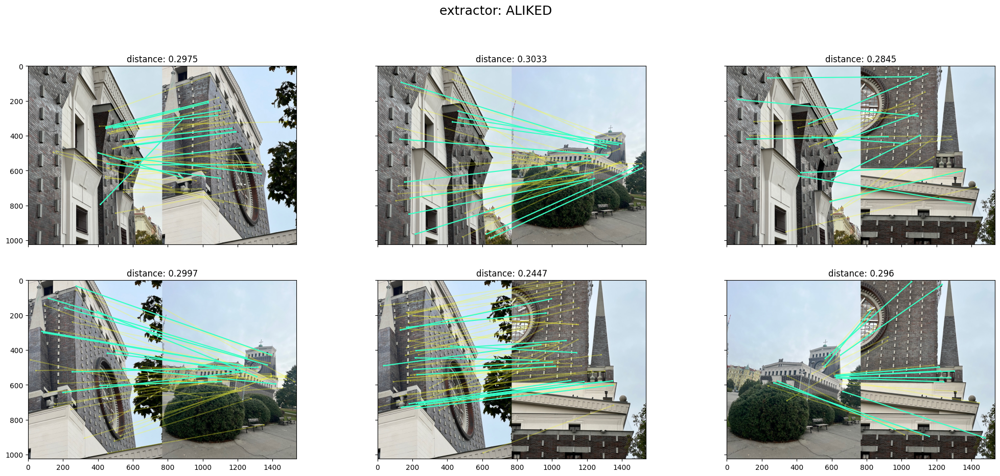

In [11]:
extractor = ALIKED(max_num_keypoints=4096, detection_threshold=0.01, resize=1024).eval().to(device, torch.float32)
matcher = KF.LightGlue('aliked').eval().to(device)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(25, 10), sharey=True, sharex=True)
plt.suptitle(f'extractor: ALIKED', y=1, fontsize=18)
for i, fig_x in enumerate(ax.flatten()):
    pair = matches[i]
    image0 = load_torch_image(images_list[pair[0]], device=device).to(torch.float32)
    image1 = load_torch_image(images_list[pair[1]], device=device).to(torch.float32)
    feats0 = extractor.extract(image0.to(device))
    feats1 = extractor.extract(image1.to(device))
    matches_ = matcher({'image0': feats0, 'image1': feats1})

    idxs = matches_['matches'][0]
    mkpts1, mkpts2 = get_matching_keypoints(feats0['keypoints'][0], feats1['keypoints'][0], idxs)
    Fm, inliers = cv2.findFundamentalMat(mkpts1.detach().cpu().numpy(), mkpts2.detach().cpu().numpy(), cv2.USAC_MAGSAC, 1.0, 0.999, 100000)
    inliers = inliers > 0
    get_img(image0, image1, feats0, feats1, inliers, fig_x, pair[-1])

Downloading: "https://github.com/cvg/LightGlue/releases/download/v0.1_arxiv/superpoint_lightglue.pth" to /root/.cache/torch/hub/checkpoints/superpoint_lightglue_v0-1_arxiv-pth
100%|██████████| 45.3M/45.3M [00:00<00:00, 48.9MB/s]


Loaded LightGlue model


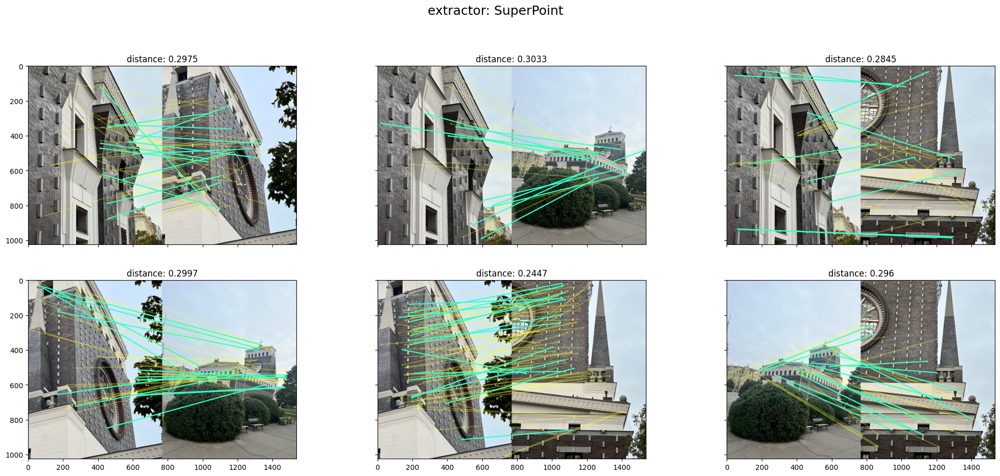

In [12]:
extractor = SuperPoint(max_num_keypoints=4096, detection_threshold=0.01, resize=1024).eval().to(device, torch.float32)
matcher = KF.LightGlue('superpoint').eval().to(device)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(25, 10), sharey=True, sharex=True)
plt.suptitle(f'extractor: SuperPoint', y=1, fontsize=18)
for i, fig_x in enumerate(ax.flatten()):
    pair = matches[i]
    image0 = load_torch_image(images_list[pair[0]], device=device).to(torch.float32)
    image1 = load_torch_image(images_list[pair[1]], device=device).to(torch.float32)
    feats0 = extractor.extract(image0.to(device))
    feats1 = extractor.extract(image1.to(device))
    matches_ = matcher({'image0': feats0, 'image1': feats1})

    idxs = matches_['matches'][0]
    mkpts1, mkpts2 = get_matching_keypoints(feats0['keypoints'][0], feats1['keypoints'][0], idxs)
    Fm, inliers = cv2.findFundamentalMat(mkpts1.detach().cpu().numpy(), mkpts2.detach().cpu().numpy(), cv2.USAC_MAGSAC, 1.0, 0.999, 100000)
    inliers = inliers > 0
    get_img(image0, image1, feats0, feats1, inliers, fig_x, pair[-1])

Downloading: "https://github.com/cvg/LightGlue/releases/download/v0.1_arxiv/sift_lightglue.pth" to /root/.cache/torch/hub/checkpoints/sift_lightglue_v0-1_arxiv-pth
100%|██████████| 45.4M/45.4M [00:00<00:00, 48.1MB/s]


Loaded LightGlue model


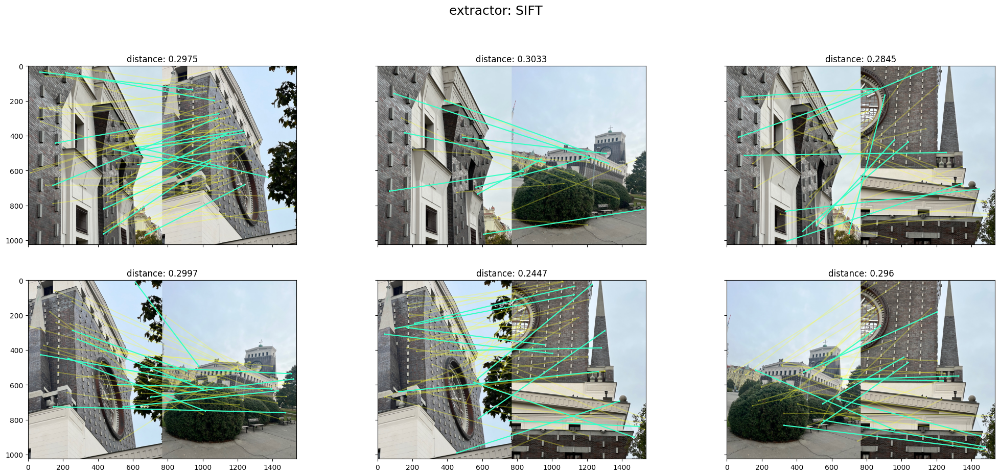

In [13]:
extractor = SIFT(max_num_keypoints=4096, detection_threshold=0.01, resize=1024).eval().to(device, torch.float32)
matcher = KF.LightGlue('sift').eval().to(device)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(25, 10), sharey=True, sharex=True)
plt.suptitle(f'extractor: SIFT', y=1, fontsize=18)
for i, fig_x in enumerate(ax.flatten()):
    pair = matches[i]
    image0 = load_torch_image(images_list[pair[0]], device=device).to(torch.float32)
    image1 = load_torch_image(images_list[pair[1]], device=device).to(torch.float32)
    feats0 = extractor.extract(image0.to(device))
    feats1 = extractor.extract(image1.to(device))
    matches_ = matcher({'image0': feats0, 'image1': feats1})

    idxs = matches_['matches'][0]
    mkpts1, mkpts2 = get_matching_keypoints(feats0['keypoints'][0], feats1['keypoints'][0], idxs)
    Fm, inliers = cv2.findFundamentalMat(mkpts1.detach().cpu().numpy(), mkpts2.detach().cpu().numpy(), cv2.USAC_MAGSAC, 1.0, 0.999, 100000)
    inliers = inliers > 0
    get_img(image0, image1, feats0, feats1, inliers, fig_x, pair[-1])

Downloading: "https://github.com/cvg/LightGlue/releases/download/v0.1_arxiv/disk_lightglue.pth" to /root/.cache/torch/hub/checkpoints/disk_lightglue_v0-1_arxiv-pth
100%|██████████| 45.4M/45.4M [00:00<00:00, 316MB/s]


Loaded LightGlue model


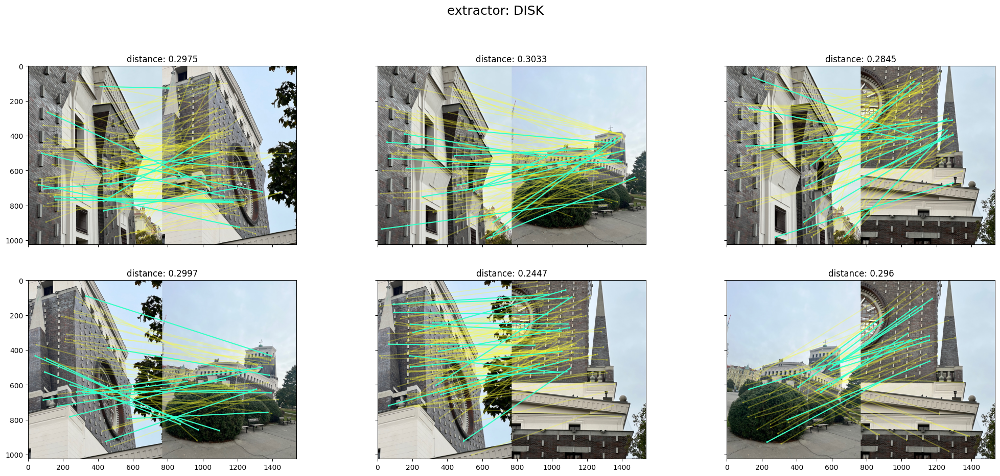

In [14]:
extractor = DISK(max_num_keypoints=4096, detection_threshold=0.01, resize=1024).eval().to(device, torch.float32)
matcher = KF.LightGlue('disk').eval().to(device)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(25, 10), sharey=True, sharex=True)
plt.suptitle(f'extractor: DISK', y=1, fontsize=18)
for i, fig_x in enumerate(ax.flatten()):
    pair = matches[i]
    image0 = load_torch_image(images_list[pair[0]], device=device).to(torch.float32)
    image1 = load_torch_image(images_list[pair[1]], device=device).to(torch.float32)
    feats0 = extractor.extract(image0.to(device))
    feats1 = extractor.extract(image1.to(device))
    matches_ = matcher({'image0': feats0, 'image1': feats1})

    idxs = matches_['matches'][0]
    mkpts1, mkpts2 = get_matching_keypoints(feats0['keypoints'][0], feats1['keypoints'][0], idxs)
    Fm, inliers = cv2.findFundamentalMat(mkpts1.detach().cpu().numpy(), mkpts2.detach().cpu().numpy(), cv2.USAC_MAGSAC, 1.0, 0.999, 100000)
    inliers = inliers > 0
    get_img(image0, image1, feats0, feats1, inliers, fig_x, pair[-1])